# Overview

This notebook processes cell *x* gene count matricies through the following steps:

0. import data/metadata
1. QC cell exclusion
2. scran normalization 
3. log(p+1) transformation of normalized gene counts
4. selection for highly variable genes (HVGs)
5. regress out count information as a covariate
6. scale data to unit variance
7. dimension reduction using PCA
8. make a neighborhood graph (if combining sublibraries, use the BBKNN method)
9. Louvain-cluster cells
10. map cells to Allen clusters using *raw* counts *after* filtering
11. write processed AnnData object to file

Importantly, this uses the output from the Parse bioinformatics pipeline that is stored in the DGE_filtered directory. This means that it has already undergone some filtering using Parse's barcode rank-order plot, which effectively discards cells with too few transcripts. See [this page](https://support.parsebiosciences.com/hc/en-us/articles/4483706086164-How-are-cell-counts-determined-) for more info (requires Parse login information).

# Preprocessing

In [1]:
import os
import clusta
import scanpy as sc
import matplotlib.pyplot as plt

plt.rcParams['font.family'] = 'avenir'
sc.settings.set_figure_params(dpi=150, fontsize=10, dpi_save=300, figsize=(5,5), format='png')

In [2]:
dataset = 'May2024'
sublib = 'combined'

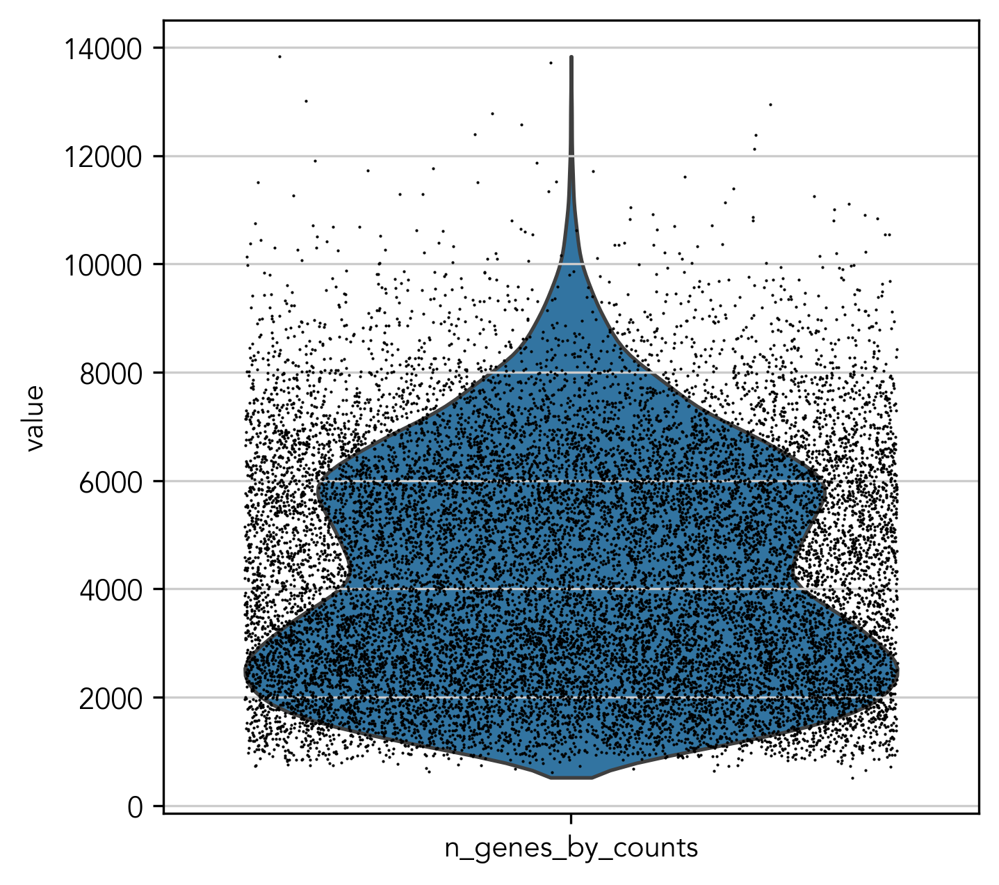

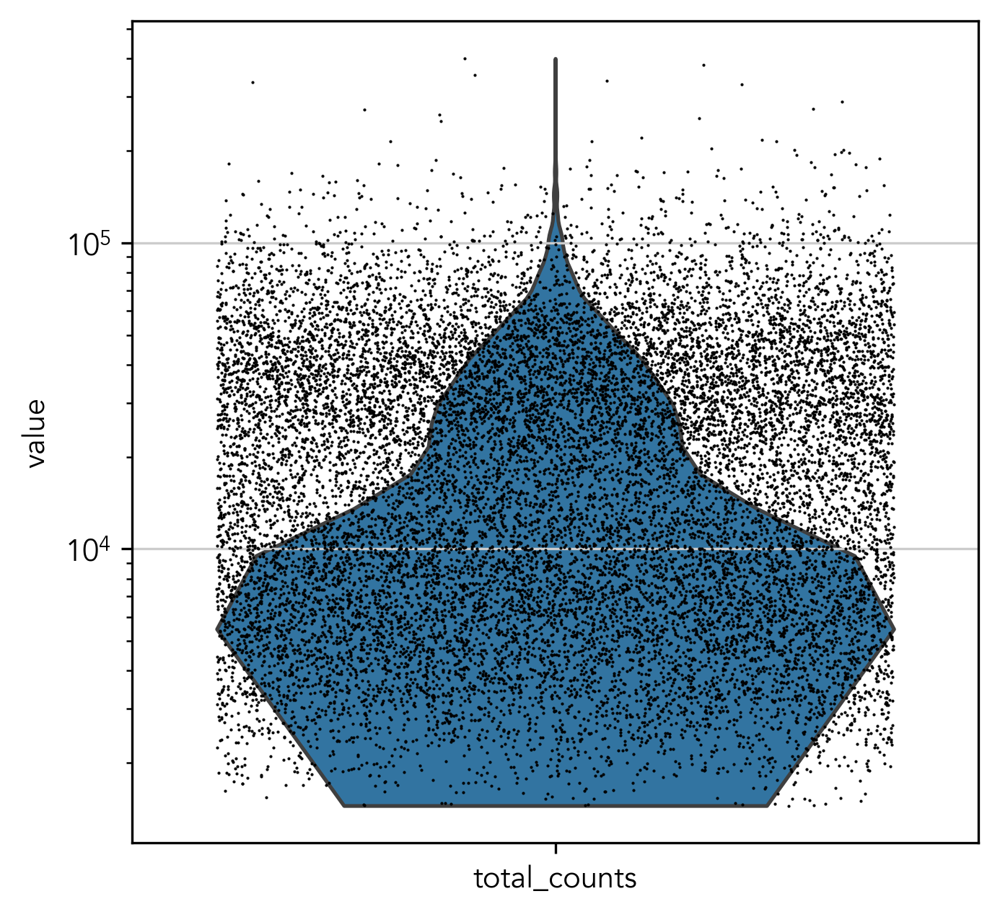

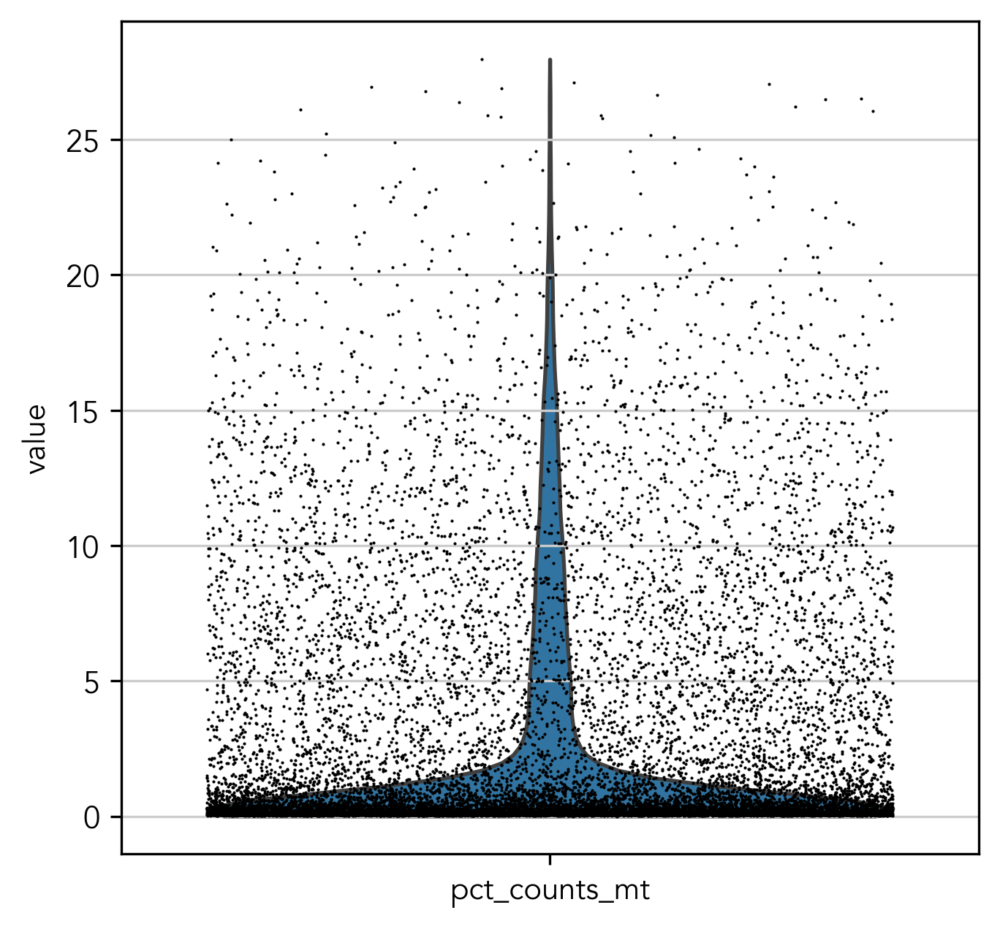

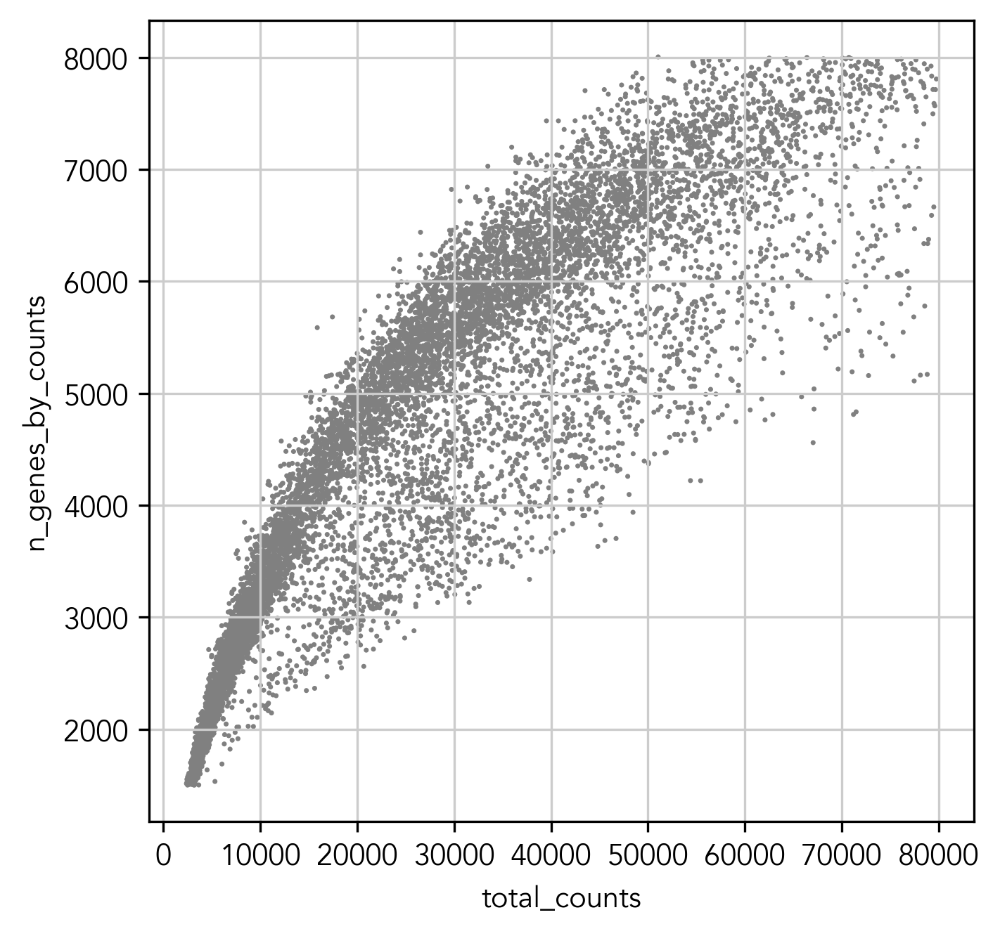

median transcript count per cell: 25627.0
median gene count per cell: 4825.0
(10443, 29539)
Clusters is set to None
Using max_size =  3000 , clusters have been split into  4  clusters.
min_mean =  0.1
--- 3.76 mins ---
size factor min =  0.03390224591541457
size factor max =  3.3389440749742145


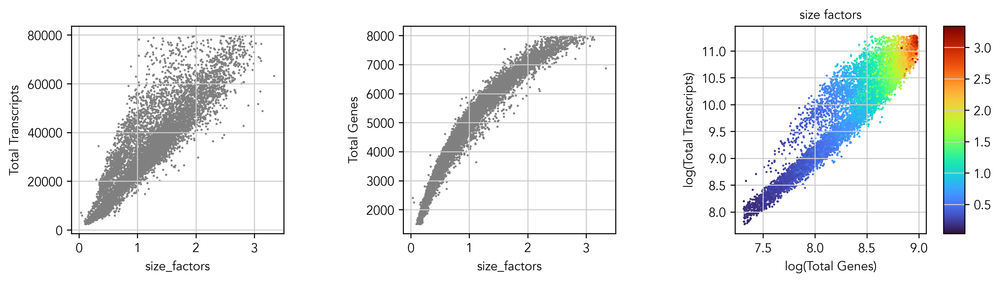

Normalizing active adata.X matrix by dividing counts by size factors
Transforming normalized adata.X using natural log +1
Storing normalized (and log transformed if 'log1p=True') adata.X as layer = scranPY


<Figure size 750x750 with 0 Axes>

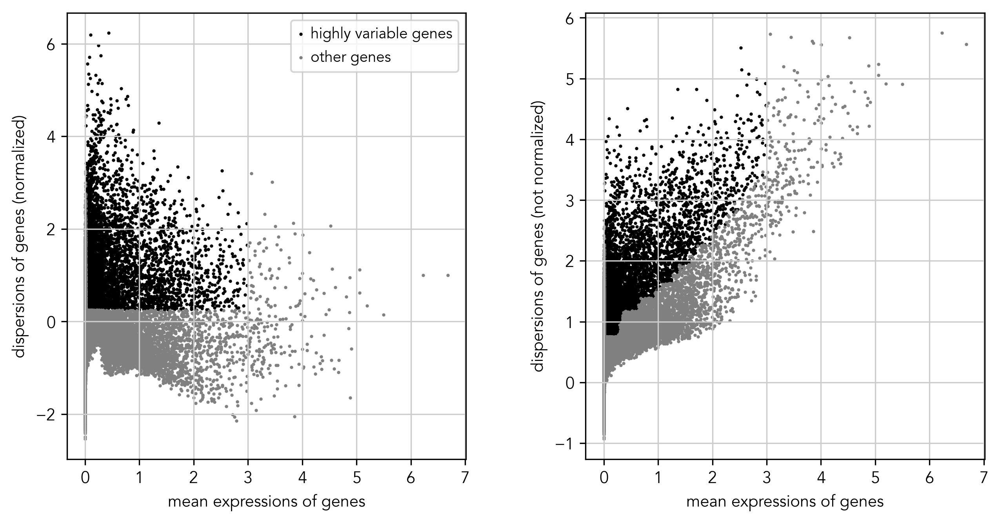

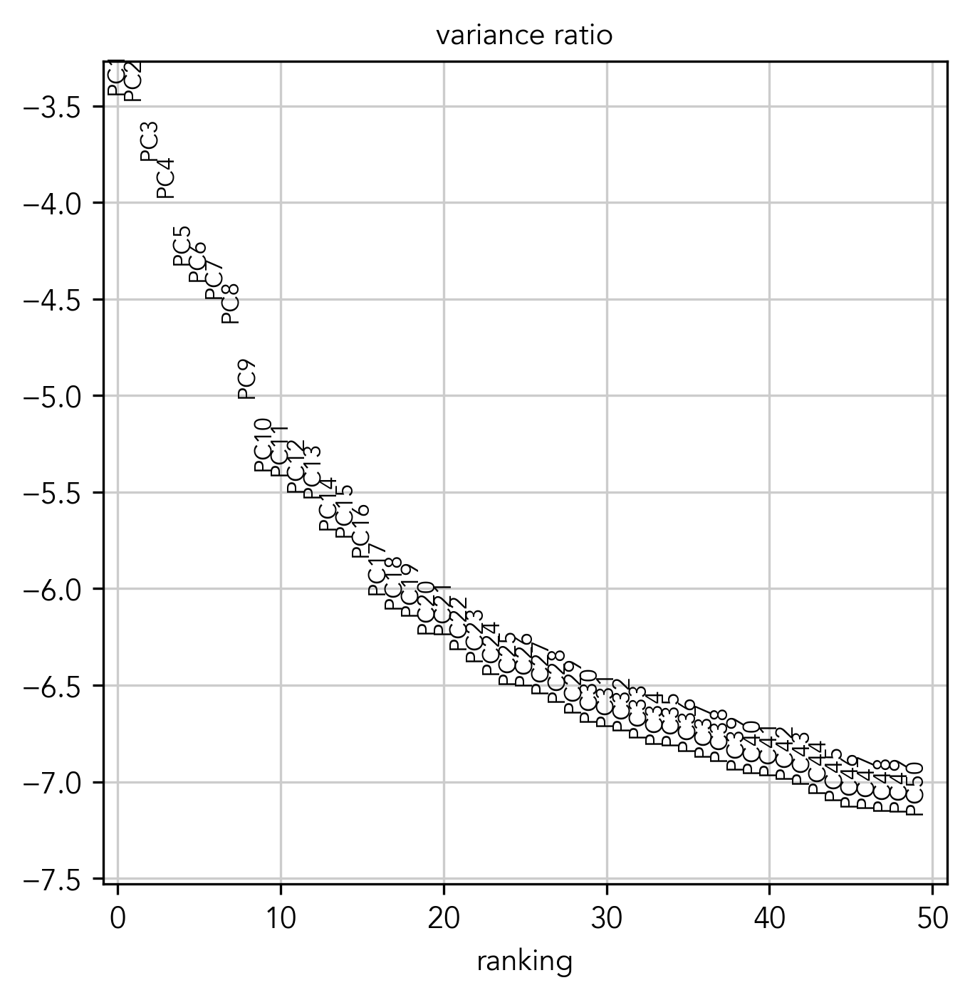

In [3]:
### 0. import data and metadata
data_path = clusta.get_data_path(sublib, dataset)
adata = clusta.read_raw_count_matrix(sublib, dataset)

### 1. QC cell exclusion
adata = clusta.qc_filter_cells(adata)

### 2. normalize and log1p transform
adata = clusta.normalize_and_log1p_transform(adata)

### 3. select highly variable genes
adata = clusta.select_hvgs(adata, save_new_adata=True)

### 4. regress out covariates
adata = clusta.regress_out_covariates(adata)

### 5. scale data
adata = clusta.scale_data(adata)

### 6. run PCA
adata = clusta.run_pca(adata)

need to break up commands so user chooses PC number from scree plot

In [7]:
num_PCs_to_use = 41

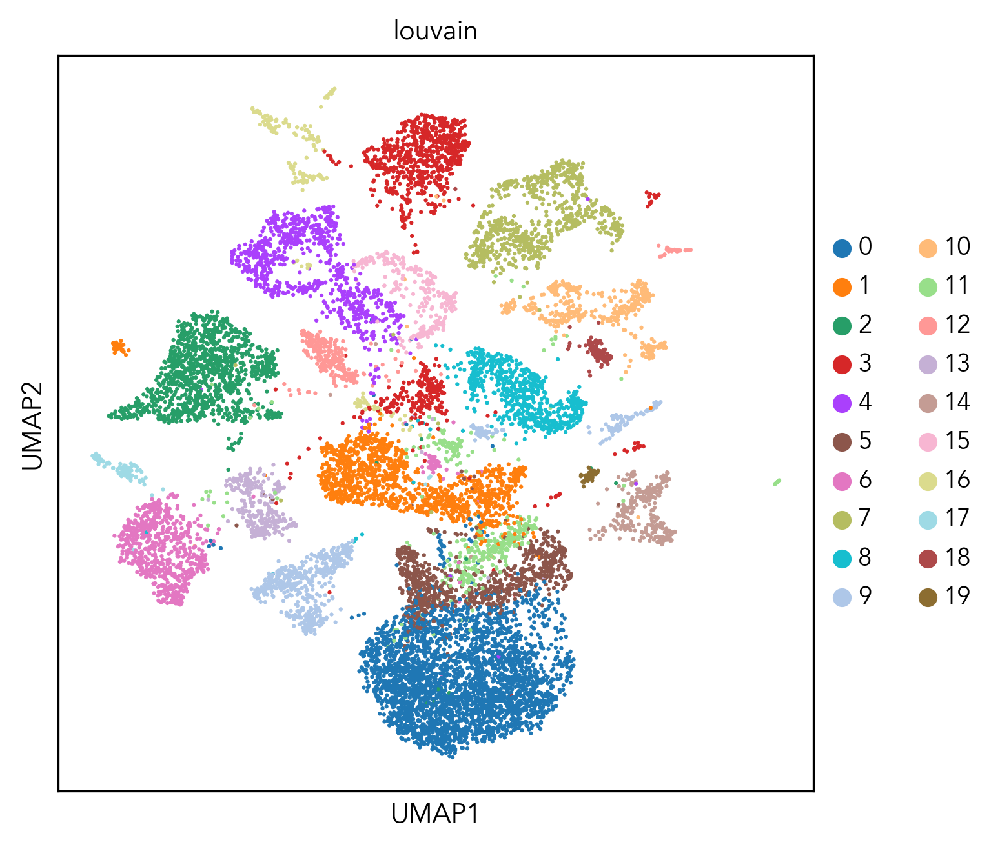

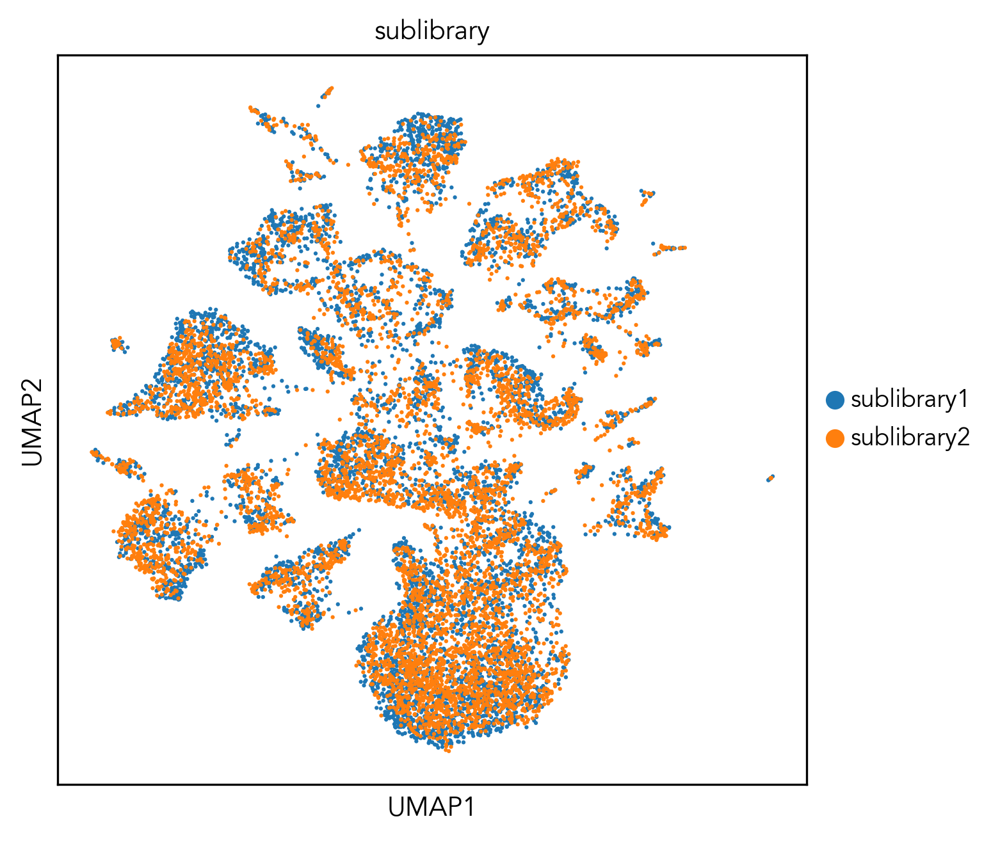

File not overwritten. Exiting...


In [8]:
### 7. run neighborhood graph
adata = clusta.make_neighborhood_graph(adata, num_PCs_to_use)

### 8. louvain cluster + UMAP
adata = clusta.louvain_cluster(adata)

### 9. make adata lean for Allen mapping
clusta.make_adata_lean(adata, 'adata_lean.h5ad')

~Map cells using online tool, save to file~

In [9]:
csv_path = 'adata_lean_10xWholeMouseBrain(CCN20230722)_HierarchicalMapping_UTC_1718736096730/adata_lean_10xWholeMouseBrain(CCN20230722)_HierarchicalMapping_UTC_1718736096730.csv'

In [10]:
### 10. merge Allen-cell-type metadata to into adata
adata = clusta.merge_allen_celltypes(adata, csv_path)

### 11. map consistent colors to Allen cell type assignments
adata = clusta.get_taxonomy_cmap(adata)


In [11]:
### 12. save adata
adata.obs['condition'] = adata.obs['sample'].str[:-1]
adata.var['gene_name'] = adata.var.index
adata.write(os.path.join(data_path, 'adata.h5ad'))

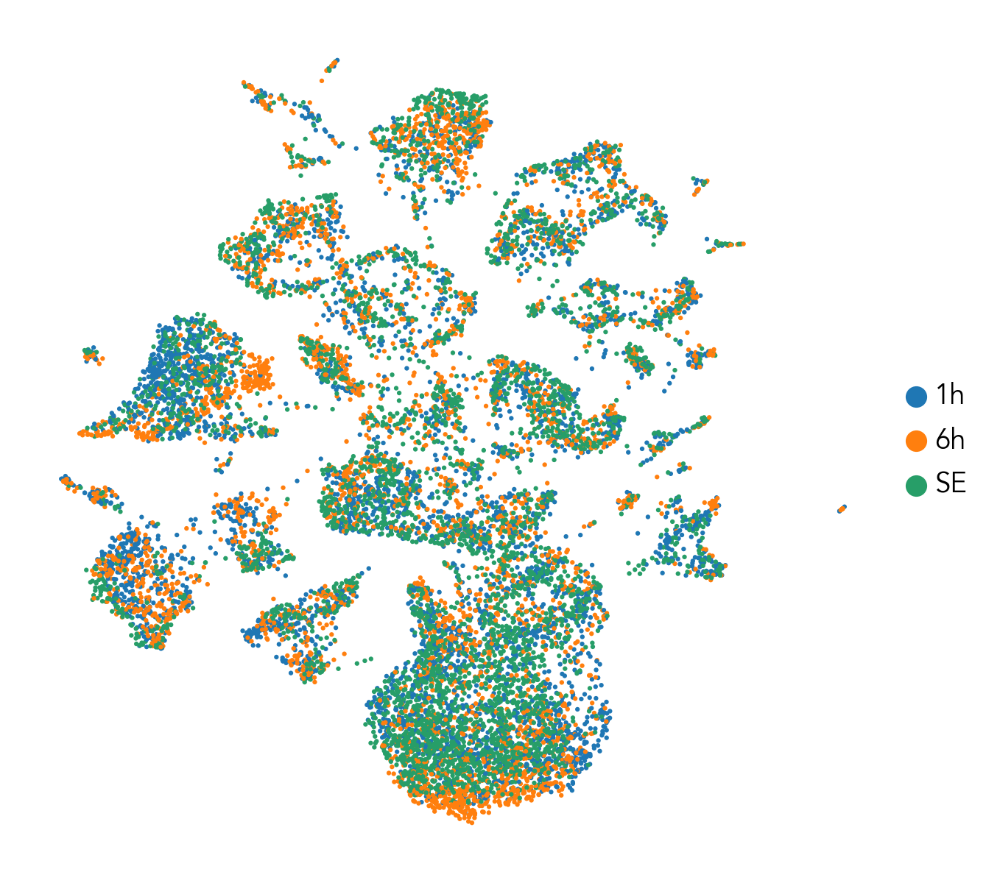

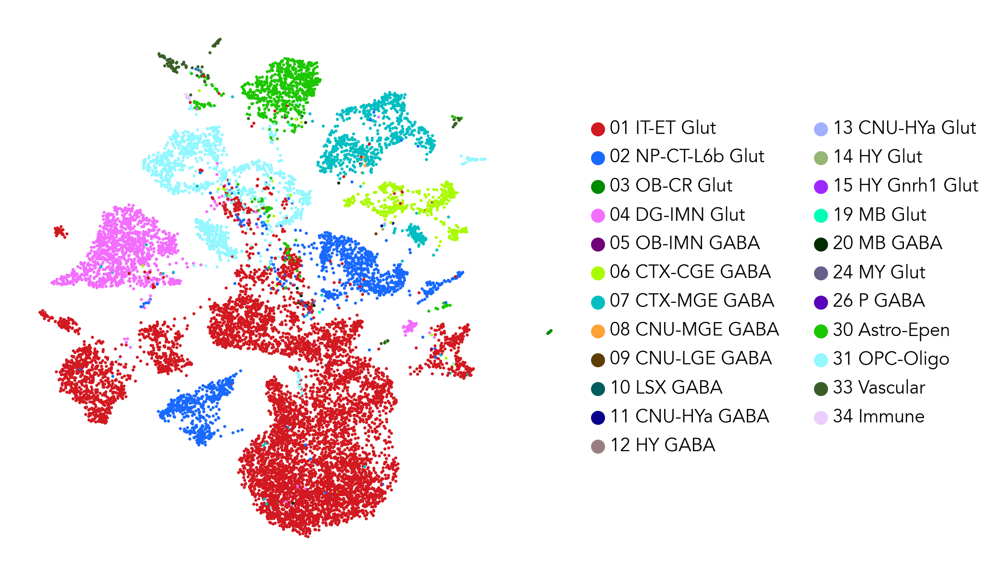

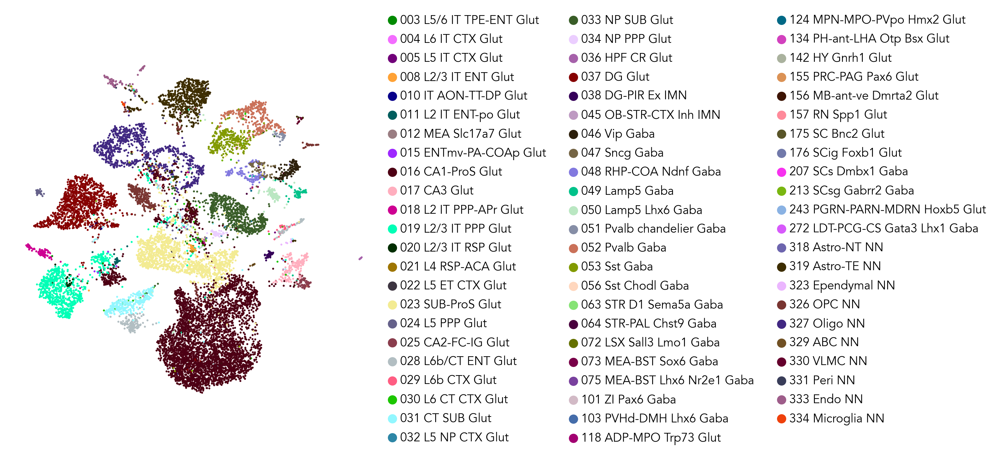

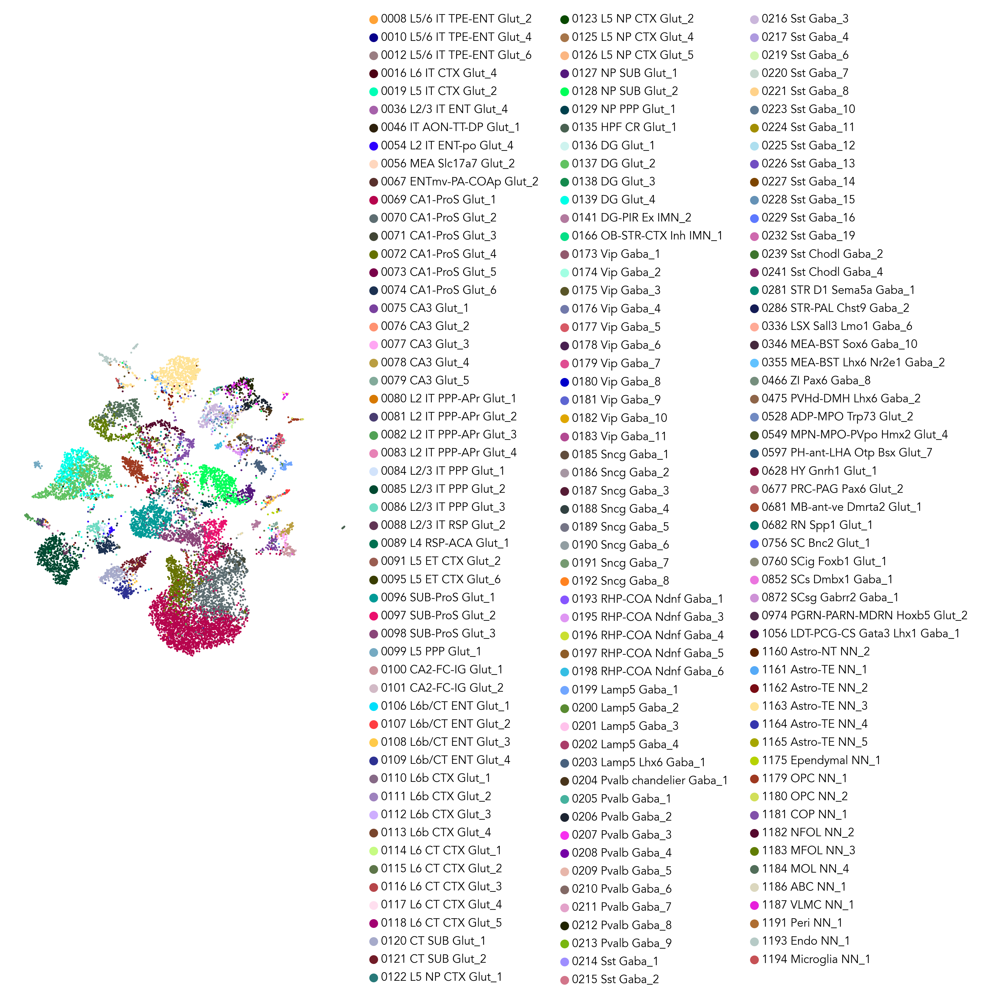

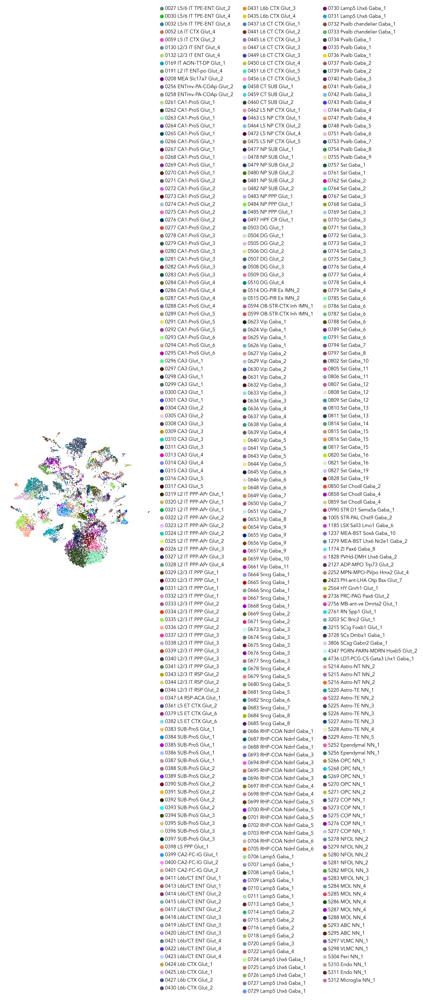

In [12]:
### 13. make plots!
adata.obs['condition'] = adata.obs['sample'].str[:-1]
labs = ['condition', 'class_name', 'subclass_name', 'supertype_name', 'cluster_name']

for lab in labs:
    sc.pl.umap(adata, color=[lab], show=False)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['left'].set_visible(False)
    plt.gca().spines['bottom'].set_visible(False)
    plt.gca().set_xlabel('')
    plt.gca().set_ylabel('')
    plt.gca().set_title('')
    # plt.gca().get_legend().remove()